# IMPORTING LIBRAIRES

In [1]:
import os
import pandas as pd
from afinn import Afinn
import pandas as pd
from matplotlib import style
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import string
string.punctuation
import nltk
from nltk.stem import WordNetLemmatizer
import re
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Setting the Folder directory and its path
path1= '2_reviews_per_movie_raw\\'

folder = os.fsencode(path1)

#Declaring a list which contains the filenames of all the files in that directory
filenames = []

#Traversing the folder, and appending all the files that ends with csv, to the list
for file in os.listdir(folder):
    filename = os.fsdecode(file)
    if filename.endswith( ('.csv') ):
        filenames.append(filename)

#Sorting the list as per thier names
filenames.sort()
display(filenames)

#Lenght of filenames, or the total number of csv files in that folder
length = len(filenames)

['10 Cloverfield Lane 2016.csv',
 '10 Things I Hate About You 1999.csv',
 '12 Angry Men 1957.csv',
 '12 Monkeys 1995.csv',
 '12 Strong 2018.csv',
 '12 Years a Slave 2013.csv',
 '127 Hours 2010.csv',
 '13 Hours 2016.csv',
 '1408 2007.csv',
 '1917 2019.csv',
 '1941 1979.csv',
 '2001_ A Space Odyssey 1968.csv',
 '2012 2009.csv',
 '21 2008.csv',
 '21 Jump Street 2012.csv',
 '22 Jump Street 2014.csv',
 '28 Days Later... 2002.csv',
 '28 Weeks Later 2007.csv',
 '3 Idiots 2009.csv',
 '30 Days of Night 2007.csv',
 '300 2006.csv',
 '3_10 to Yuma 2007.csv',
 '42 2013.csv',
 '50 First Dates 2004.csv',
 '500 Days of Summer 2009.csv',
 '50_50 2011.csv',
 '54 1998.csv',
 '8 Mile 2002.csv',
 'A Beautiful Mind 2001.csv',
 'A Bridge Too Far 1977.csv',
 "A Bug's Life 1998.csv",
 'A Clockwork Orange 1971.csv',
 "A Hard Day's Night 1964.csv",
 'A Night at the Roxbury 1998.csv',
 'A Nightmare on Elm Street 1984.csv',
 'A Quiet Place 2018.csv',
 'A Star Is Born 2018.csv',
 'A Walk to Remember 2002.csv',
 'Ab

# PREPROCESSING FUNCTIONS

In [3]:
#defining the function to remove punctuation
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree

#defining function for tokenization
def tokenization(text):
    tokens = re.split('W+',text)
    return tokens

#Stop words present in the library
stopwords = nltk.corpus.stopwords.words('english')
stopwords[0:10]
['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

#defining the function to remove stopwords from tokenized text
def remove_stopwords(text):
    output= [i for i in text if i not in stopwords]
    return output

#defining the object for Lemmatization
wordnet_lemmatizer = WordNetLemmatizer()

#defining the function for lemmatization
def lemmatizer(text):
    lemm_text = [wordnet_lemmatizer.lemmatize(word) for word in text]
    return lemm_text

# HANDLING REVIEW-MOVIE WISE DATASET & APPLYING AFFIN

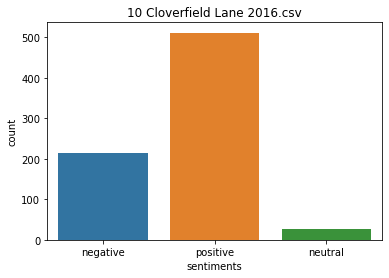

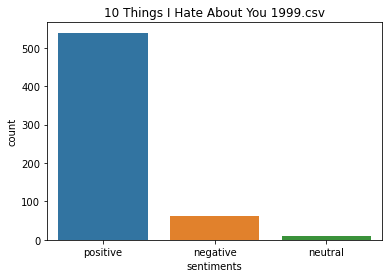

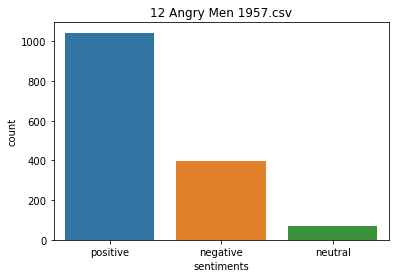

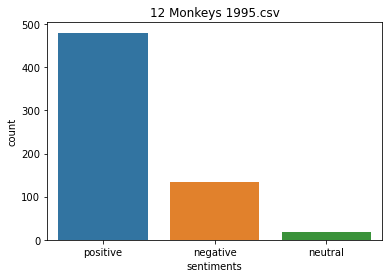

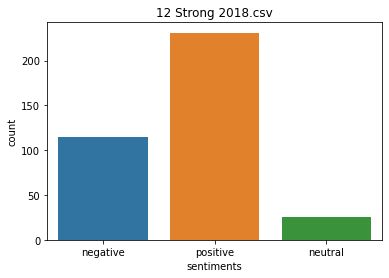

...

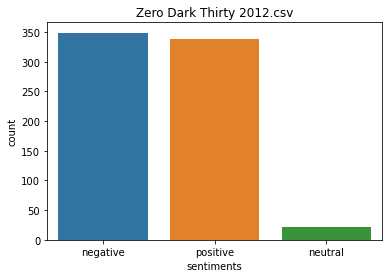

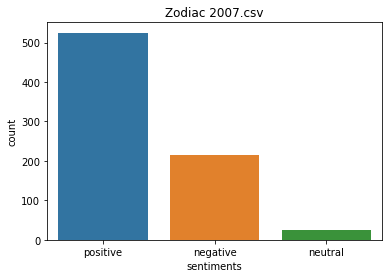

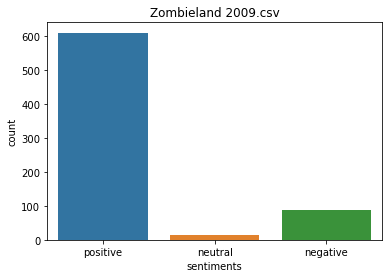

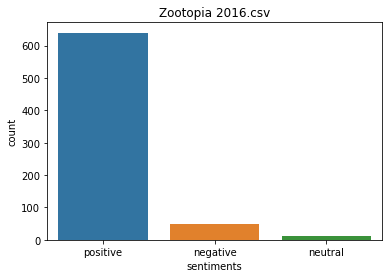

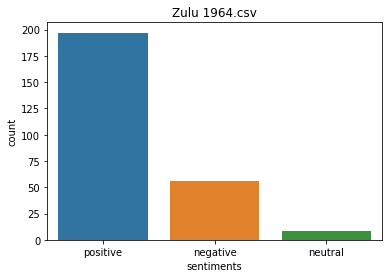

In [4]:
#list of datframes
df = []

#Loop to travers all the files
for i in range(length):
    f= pd.read_csv(path1+filenames[i])
    
    #Drop columns which are not required
    f.drop(['helpful','total', 'date','title'], axis=1, inplace=True)
    
    #storing the puntuation free text
    f['review']= f['review'].apply(lambda x:remove_punctuation(x))
    
    #Converting text to lowercase
    f['review']= f['review'].apply(lambda x: x.lower())
    
    #applying tokenization function to the column
    f['review']= f['review'].apply(lambda x: tokenization(x))
    
    #applying the remove_stopwords function
    f['review']= f['review'].apply(lambda x:remove_stopwords(x))
    
    #applying the lemmatizer function
    f['review']=f['review'].apply(lambda x:lemmatizer(x))
    
    #converting column to string
    f['review']=f['review'].apply(str)
    
    #Converting all the reviews of the dataframe, into a list
    news_df = f.review.values.tolist()
    
    #Applying Afinn algorithm to calculate the scores of each review
    afn = Afinn()
    scores = [afn.score(article) for article in news_df]
    
    #To find the sentiment of each review as per the score
    sentiment = ['positive' if score > 0
                              else 'negative' if score < 0
                                  else 'neutral'
                                      for score in scores]

    f['scores'] = scores
    f['sentiments'] = sentiment
    f['Name'] = filenames[i]
    f['Name'] = [x[:-9] for x in f['Name']]
    
    #To set the first column as Name or basically to reposition the column
    f = f[['Name', 'username', 'rating', 'review', 'scores', 'sentiments']]
    
    f = f.rename(columns={'Name': 'name'})
    
    #Drop the review column since it is no longer needed
    f.drop(['review'], axis=1, inplace=True)
    
    #To plot a count plot based on the sentiments of the dataframe
    sns.countplot(x ='sentiments', data = f).set(title=filenames[i])
    plt.show()
    
    #Merging all the cvs into 1 list of dataframes
    df.append(f)
s = pd.concat(df)

In [5]:
s.head()

,name,username,rating,scores,sentiments
0,10 Cloverfield Lane,Imme-van-Gorp,7,-4.0,negative
1,10 Cloverfield Lane,sonofocelot-1,5,-24.0,negative
2,10 Cloverfield Lane,mhodaee,5,-12.0,negative
3,10 Cloverfield Lane,fil-nik09,5,1.0,positive
4,10 Cloverfield Lane,DVR_Brale,7,5.0,positive


In [6]:
s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 932464 entries, 0 to 260
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   name        932464 non-null  object 
 1   username    932464 non-null  object 
 2   rating      932464 non-null  object 
 3   scores      932464 non-null  float64
 4   sentiments  932464 non-null  object 
dtypes: float64(1), object(4)
memory usage: 42.7+ MB


In [7]:
s.to_csv("temp.csv", index="false")

# HANDLING GENRE WISE DATASETS

In [8]:
#Setting the Folder directory and its path
path2= '1_movies_per_genre\\'
folder = os.fsencode(path2)

#Declaring a list which contains the filenames of all the files in that directory
filenames = []

#Traversing the folder, and appending all the files that ends with csv, to the list
for file in os.listdir(folder):
    filename = os.fsdecode(file)
    if filename.endswith( ('.csv') ):
        filenames.append(filename)

#Sorting the list as per thier names
filenames.sort()
display(filenames)

#Lenght of filenames, or the total number of csv files in that folder
length = len(filenames)

['Action.csv',
 'Adventure.csv',
 'Animation.csv',
 'Biography.csv',
 'Comedy.csv',
 'Crime.csv',
 'Drama.csv',
 'Fantasy.csv',
 'History.csv',
 'Horror.csv',
 'Music.csv',
 'Mystery.csv',
 'Romance.csv',
 'Sci-Fi.csv',
 'Sport.csv',
 'Thriller.csv',
 'War.csv']

In [9]:
#list of datframes
dfm = []

#Loop to travers all the files
for i in range(length):
    
    #Read csv with filename from list
    f= pd.read_csv(path2+filenames[i])
    
    #Drop columns which are not required
    f.drop(['review_url'], axis=1, inplace=True)
    
    #Merging all the cvs into 1 list of dataframes
    dfm.append(f)
    
#Concating list of dataframes into a single dataframe
r = pd.concat(dfm)

In [10]:
#Drop duplicate values on the basis of movie name
r = r.drop_duplicates(subset='name', keep="first")

In [11]:
#merging two csv using inner join on the basis of thier common column name
df = pd.merge(r,s , on='name')

#Required columns
df.columns = ['Name', 'Year', 'Rated', 'Duration', 'Genres', 'Release Date', 'IMDB Rating', 'Num Raters', 'Num Reviews', 'Username', 'User Rating', 'Scores', 'Sentiments']
display(df.head())

,Name,Year,Rated,Duration,Genres,Release Date,IMDB Rating,Num Raters,Num Reviews,Username,User Rating,Scores,Sentiments
0,The Dark Knight,2008,PG-13,2h 32min,Action; Crime; Drama;,18 July 2008 (USA),9.0,2224522,6836,MR_Heraclius,10,9.0,positive
1,The Dark Knight,2008,PG-13,2h 32min,Action; Crime; Drama;,18 July 2008 (USA),9.0,2224522,6836,Smells_Like_Cheese,10,11.0,positive
2,The Dark Knight,2008,PG-13,2h 32min,Action; Crime; Drama;,18 July 2008 (USA),9.0,2224522,6836,straightblaster,10,26.0,positive
3,The Dark Knight,2008,PG-13,2h 32min,Action; Crime; Drama;,18 July 2008 (USA),9.0,2224522,6836,Aaron_Kyle,9,11.0,positive
4,The Dark Knight,2008,PG-13,2h 32min,Action; Crime; Drama;,18 July 2008 (USA),9.0,2224522,6836,filmquestint,10,27.0,positive


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 794400 entries, 0 to 794399
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Name          794400 non-null  object 
 1   Year          794400 non-null  int64  
 2   Rated         794400 non-null  object 
 3   Duration      794400 non-null  object 
 4   Genres        794400 non-null  object 
 5   Release Date  794400 non-null  object 
 6   IMDB Rating   794400 non-null  float64
 7   Num Raters    794400 non-null  int64  
 8   Num Reviews   794400 non-null  int64  
 9   Username      794400 non-null  object 
 10  User Rating   794400 non-null  object 
 11  Scores        794400 non-null  float64
 12  Sentiments    794400 non-null  object 
dtypes: float64(2), int64(3), object(8)
memory usage: 84.9+ MB


Dataset after merging genre wise, and movie wise sentiments

In [13]:
#Splitting the column to date of release and country
new = df["Release Date"].str.split("(", n = 1, expand = True)
df["Date of Release"]= new[0]
df["Country"]= new[1]

#Dropping not required columns
df.drop(columns =["Release Date"], inplace = True)
df['Country'] = [x[:-1] for x in df['Country']]

In [14]:
#To divide the year columns in decades
period_length = 10
start_year = 1940
end_year = 2019

year_range = end_year - start_year
modulo = year_range % period_length

if modulo == 0:
    final_start = end_year - period_length
else:
    final_start = end_year - modulo
final_end = end_year + 1

starts = np.arange(start_year, final_start, period_length).tolist()

tuples = [(start, start+period_length) for start in starts]
tuples.append(tuple([final_start, final_end]))
bins = pd.IntervalIndex.from_tuples(tuples, closed='left')

original_labels = list(bins.astype(str))
new_labels = ['{} - {}'.format(b.strip('[)').split(', ')[0], int(b.strip('[)').split(', ')[1])-1) for b in original_labels]
label_dict = dict(zip(original_labels, new_labels))

df['Decade'] = pd.cut(df['Year'], bins=bins, include_lowest=True, precision=0)
df['Decade'] = df['Decade'].astype("str")
df = df.replace(label_dict)

In [15]:
# To get the duration in minutes
df['Duration'] = df['Duration'].str.replace("h", '*60').str.replace('min','*1').str.replace(' ','+').apply(eval)

#To divide the duration columns in intervals
period_length = 15
start_year = 90
end_year = 195

starts = np.arange(start_year, final_start, period_length).tolist()

tuples = [(start, start+period_length) for start in starts]
tuples.append(tuple([final_start, final_end]))
bins = pd.IntervalIndex.from_tuples(tuples, closed='left')

original_labels = list(bins.astype(str))
new_labels = ['{} - {}'.format(b.strip('[)').split(', ')[0], int(b.strip('[)').split(', ')[1])-1) for b in original_labels]
label_dict = dict(zip(original_labels, new_labels))

df['Duration(Mins)'] = pd.cut(df['Duration'], bins=bins, include_lowest=True, precision=0)
df['Duration(Mins)'] = df['Duration(Mins)'].astype("str")
df = df.replace(label_dict)
df.drop(columns =["Duration"], inplace = True)
df = df.round({"IMDB Rating":0})
df.head()

,Name,Year,Rated,Genres,IMDB Rating,Num Raters,Num Reviews,Username,User Rating,Scores,Sentiments,Date of Release,Country,Decade,Duration(Mins)
0,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,MR_Heraclius,10,9.0,positive,18 July 2008,USA,2000 - 2009,150 - 164
1,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,Smells_Like_Cheese,10,11.0,positive,18 July 2008,USA,2000 - 2009,150 - 164
2,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,straightblaster,10,26.0,positive,18 July 2008,USA,2000 - 2009,150 - 164
3,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,Aaron_Kyle,9,11.0,positive,18 July 2008,USA,2000 - 2009,150 - 164
4,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,filmquestint,10,27.0,positive,18 July 2008,USA,2000 - 2009,150 - 164


# HANDLING METADATA DATASET

In [16]:
dfm = pd.read_csv("MetaData.csv")
dfm.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 645, 'name': 'James Bond Collection', '...",58000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 28, '...",http://www.mgm.com/view/movie/757/Goldeneye/,710,tt0113189,en,GoldenEye,James Bond must unmask the mysterious head of ...,...,16-11-1995,352194034,130.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,No limits. No fears. No substitutes.,GoldenEye,False,6.6,1194
1,False,"{'id': 43563, 'name': 'Friday Collection', 'po...",3500000,"[{'id': 35, 'name': 'Comedy'}]",http://www.newline.com/properties/friday.html,10634,tt0113118,en,Friday,Craig and Smokey are two guys in Los Angeles h...,...,26-04-1995,28215918,91.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,A lot can go down between thursday and saturda...,Friday,False,7.0,513
2,False,"{'id': 10924, 'name': 'From Dusk Till Dawn Col...",19000000,"[{'id': 27, 'name': 'Horror'}, {'id': 28, 'nam...",http://www.miramax.com/movie/from-dusk-till-dawn/,755,tt0116367,en,From Dusk Till Dawn,Seth Gecko and his younger brother Richard are...,...,19-01-1996,25836616,108.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,One night is all that stands between them and ...,From Dusk Till Dawn,False,6.9,1644
3,False,"{'id': 439053, 'name': 'Brooklyn Cigar Store C...",2000000,"[{'id': 35, 'name': 'Comedy'}]",http://miramax.com/movie/blue-in-the-face/,5894,tt0112541,en,Blue in the Face,"Auggie runs a small tobacco shop in Brooklyn, ...",...,15-09-1995,1275000,83.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Welcome to the planet Brooklyn.,Blue in the Face,False,6.8,28
4,False,"{'id': 286162, 'name': 'Power Rangers Collecti...",15000000,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...",http://www.powerrangers.com/,9070,tt0113820,en,Mighty Morphin Power Rangers: The Movie,Power up with six incredible teens who out-man...,...,30-06-1995,66000000,92.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The Power Is On!,Mighty Morphin Power Rangers: The Movie,False,5.2,153


In [17]:
dfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8754 entries, 0 to 8753
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  8754 non-null   bool   
 1   belongs_to_collection  1264 non-null   object 
 2   budget                 8754 non-null   int64  
 3   genres                 8693 non-null   object 
 4   homepage               2559 non-null   object 
 5   id                     8754 non-null   int64  
 6   imdb_id                8751 non-null   object 
 7   original_language      8753 non-null   object 
 8   original_title         8754 non-null   object 
 9   overview               8678 non-null   object 
 10  popularity             8754 non-null   float64
 11  poster_path            8740 non-null   object 
 12  production_companies   7958 non-null   object 
 13  production_countries   8472 non-null   object 
 14  release_date           8747 non-null   object 
 15  reve

In [18]:
#Cleaning the dataset
dfm.drop(['adult','homepage','id','imdb_id','overview','release_date','runtime','status','tagline','title'], axis=1, inplace=True)
dfm.drop(['spoken_languages','video','vote_count','vote_average','poster_path'], axis=1, inplace=True)
dfm.drop(['belongs_to_collection','genres','production_countries'], axis=1, inplace=True)
dfm['budget'] = pd.to_numeric(dfm['budget'],errors='coerce')
dfm["Profit/Loss"] = dfm["revenue"] - dfm["budget"]
dfm.drop(['budget','revenue'], axis=1, inplace=True)
dfm.rename(columns = {'original_title':'Name'}, inplace = True)
dfm = dfm.drop_duplicates(subset="Name",keep='first')

In [19]:
#To add the Financial Stats column  using budget and revenue
a = []
for i in dfm["Profit/Loss"]:
    if i<0:
        a.append("Loss")
    elif i>0:
        a.append("Profit")
    else:
        a.append("Unknown")
dfm["Financial Stats"] = a
dfm.drop(['Profit/Loss'], axis=1, inplace=True)

In [20]:
#To divide the popularity columns in intervals
period_length = 2
start_year = 0
end_year = 34

year_range = end_year - start_year
modulo = year_range % period_length

if modulo == 0:
    final_start = end_year - period_length
else:
    final_start = end_year - modulo
final_end = end_year + 1

starts = np.arange(start_year, final_start, period_length).tolist()

tuples = [(start, start+period_length) for start in starts]
tuples.append(tuple([final_start, final_end]))
bins = pd.IntervalIndex.from_tuples(tuples, closed='left')

original_labels = list(bins.astype(str))
new_labels = ['{} - {}'.format(b.strip('[)').split(', ')[0], int(b.strip('[)').split(', ')[1])-1) for b in original_labels]
label_dict = dict(zip(original_labels, new_labels))

dfm['Popularity'] = pd.cut(dfm['popularity'], bins=bins, include_lowest=True, precision=0)
dfm['{Popularity}'] = dfm['Popularity'].astype("str")
dfm = dfm.replace(label_dict)

In [21]:
#Dropping null values
dfm = dfm[dfm['production_companies'].notna()]

#Retrieving the production company
l =[]
for i in dfm['production_companies']:
    if i=="FALSE":
        l.append(" ")
        continue
    a=""
    j=11
    while i[j]!=',':
        a=a+i[j]
        j+=1
    l.append(a)
    
dfm['Production'] = l
dfm['Production'] = [x[:-1] for x in dfm['Production']]

#Dropping not required columns
dfm.drop(['production_companies','popularity','{Popularity}'], axis=1, inplace=True)

# HANDLING AWARD DATASET

In [22]:
#laoding the award dataset
dfa = pd.read_csv("the_oscar_award.csv")

#Dropping not required columns
dfa.drop(['year_ceremony',"ceremony","name","d","category"], axis=1, inplace=True)

#Renaming column
dfa = dfa.rename(columns={'film': 'Name','winner':'Oscar Winner'})

#Dropping duplicates
dfa = dfa.drop_duplicates(subset=["Name"], keep=False)
dfa.head()

,Name,Oscar Winner
13,Chapter Two,False
30,Agatha,False
32,Butch and Sundance: The Early Days,False
33,The Europeans,False
40,Best Boy,True


In [23]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1483 entries, 13 to 4662
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Name          1483 non-null   object
 1   Oscar Winner  1483 non-null   bool  
dtypes: bool(1), object(1)
memory usage: 24.6+ KB


Cleaned Award Dataset

In [24]:
#Merging datasets using inner join
ij = pd.merge(df,dfm, on="Name", how="inner")
ij.head()

,Name,Year,Rated,Genres,IMDB Rating,Num Raters,Num Reviews,Username,User Rating,Scores,Sentiments,Date of Release,Country,Decade,Duration(Mins),original_language,Financial Stats,Popularity,Production
0,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,MR_Heraclius,10,9.0,positive,18 July 2008,USA,2000 - 2009,150 - 164,en,Profit,NaN,DC Comics
1,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,Smells_Like_Cheese,10,11.0,positive,18 July 2008,USA,2000 - 2009,150 - 164,en,Profit,NaN,DC Comics
2,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,straightblaster,10,26.0,positive,18 July 2008,USA,2000 - 2009,150 - 164,en,Profit,NaN,DC Comics
3,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,Aaron_Kyle,9,11.0,positive,18 July 2008,USA,2000 - 2009,150 - 164,en,Profit,NaN,DC Comics
4,The Dark Knight,2008,PG-13,Action; Crime; Drama;,9.0,2224522,6836,filmquestint,10,27.0,positive,18 July 2008,USA,2000 - 2009,150 - 164,en,Profit,NaN,DC Comics


In [25]:
ijj = pd.merge(ij,dfa, on="Name", how="inner")
ijj.head()

,Name,Year,Rated,Genres,IMDB Rating,Num Raters,Num Reviews,Username,User Rating,Scores,Sentiments,Date of Release,Country,Decade,Duration(Mins),original_language,Financial Stats,Popularity,Production,Oscar Winner
0,Batman Begins,2005,PG-13,Action; Adventure;,8.0,1269027,2885,marshall_web,10,58.0,positive,15 June 2005,USA,2000 - 2009,135 - 149,en,Profit,"[28, 30)",DC Comics,False
1,Batman Begins,2005,PG-13,Action; Adventure;,8.0,1269027,2885,pyrocitor,10,39.0,positive,15 June 2005,USA,2000 - 2009,135 - 149,en,Profit,"[28, 30)",DC Comics,False
2,Batman Begins,2005,PG-13,Action; Adventure;,8.0,1269027,2885,MR_Heraclius,10,17.0,positive,15 June 2005,USA,2000 - 2009,135 - 149,en,Profit,"[28, 30)",DC Comics,False
3,Batman Begins,2005,PG-13,Action; Adventure;,8.0,1269027,2885,tenten76,10,28.0,positive,15 June 2005,USA,2000 - 2009,135 - 149,en,Profit,"[28, 30)",DC Comics,False
4,Batman Begins,2005,PG-13,Action; Adventure;,8.0,1269027,2885,motta80-2,10,49.0,positive,15 June 2005,USA,2000 - 2009,135 - 149,en,Profit,"[28, 30)",DC Comics,False


In [26]:
print(ij.info())
print(ijj.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 233578 entries, 0 to 233577
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   Name               233578 non-null  object  
 1   Year               233578 non-null  int64   
 2   Rated              233578 non-null  object  
 3   Genres             233578 non-null  object  
 4   IMDB Rating        233578 non-null  float64 
 5   Num Raters         233578 non-null  int64   
 6   Num Reviews        233578 non-null  int64   
 7   Username           233578 non-null  object  
 8   User Rating        233578 non-null  object  
 9   Scores             233578 non-null  float64 
 10  Sentiments         233578 non-null  object  
 11  Date of Release    233578 non-null  object  
 12  Country            233578 non-null  object  
 13  Decade             233578 non-null  object  
 14  Duration(Mins)     233578 non-null  object  
 15  original_language  233578 non-null

# PLOTTING GRAPHS

In [27]:
#Choosing the path for the save location of the graphs
path3= 'Result\\'

#Choosing the color palette for the graphs
palette = ["Green", "Red", "Blue"]
def plotting_percentages(df, col, target):
    x, y = col, target
    
    # Temporary dataframe with percentage values
    temp_df = df.groupby(x)[y].value_counts(normalize=True)
    temp_df = temp_df.mul(100).rename('percent').reset_index()

    # Plot the figure
    sns.set(font_scale=1.5)
    g = sns.catplot(x=x, y='percent', hue=y,kind='bar', data=temp_df, palette = sns.color_palette(palette, 3),
                    height=8, aspect=2, legend_out=False)
    g.ax.set_ylim(0,100)

    # Loop through each bar in the graph and add the percentage value    
    for p in g.ax.patches:
        txt = str(p.get_height().round(1)) + '%'
        txt_x = p.get_x() 
        txt_y = p.get_height()
        g.ax.text(txt_x,txt_y,txt)
        
    # Set labels and title
    plt.title(f'{col.title()} By Percent {target.title()}', 
              fontdict={'fontsize': 30})
    plt.xlabel(f'{col.title()}', fontdict={'fontsize': 20})
    plt.ylabel(f'{target.title()} Percentage', fontdict={'fontsize': 20})
    plt.xticks(rotation=90)
    plt.savefig(path3+f'{col.title()}-Sentiments.jpg', bbox_inches="tight")
    return g

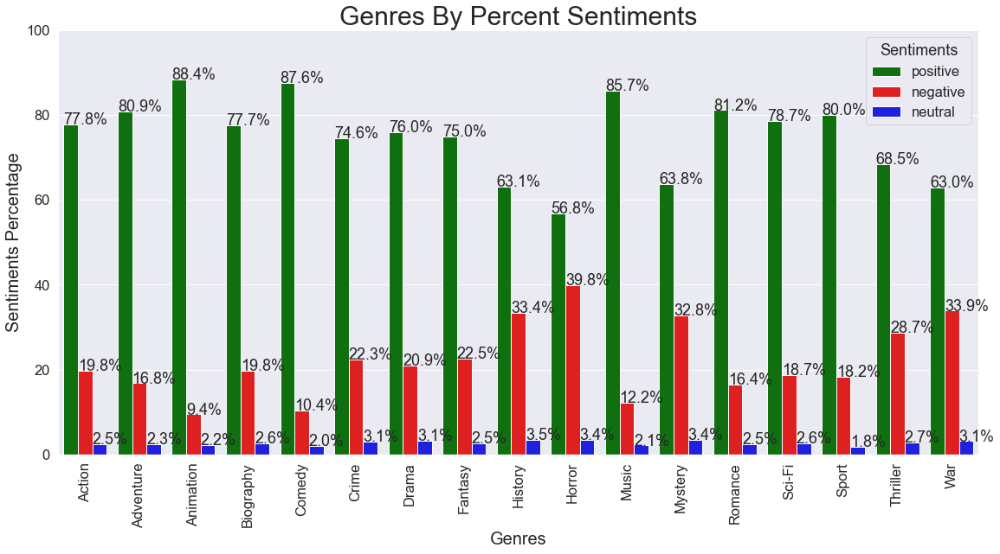

In [28]:
ij['Genres'] = ij['Genres'].str.replace(" ", "")
ij['Genres'] = [x[:-1] for x in ij['Genres']]
gen = ij.assign(Genres=ij.Genres.str.split(";")).explode('Genres')
plotting_percentages(gen,"Genres","Sentiments")

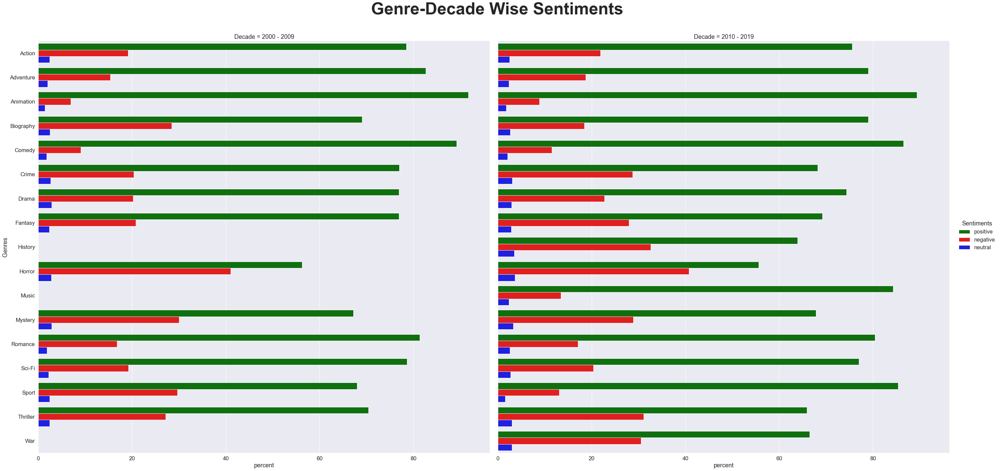

In [45]:
gendec = gen.loc[gen['Decade'].isin(['2000 - 2009', '2010 - 2019']),['Genres','Decade','Sentiments']]
temp_df = gendec.groupby(["Genres","Decade"])["Sentiments"].value_counts(normalize=True)
temp_df = temp_df.mul(100).rename('percent').reset_index()

rp = sns.catplot(y="Genres", x="percent",col = "Decade", hue="Sentiments",kind="bar", height=20, aspect=1, data=temp_df, palette = sns.color_palette(palette, 3))
rp.fig.subplots_adjust(top=0.9)
rp.fig.suptitle('Genre-Decade Wise Sentiments', fontsize=50, fontweight="bold")
plt.savefig(path3 + 'Genre-Decade Sentiments.jpg', bbox_inches="tight")

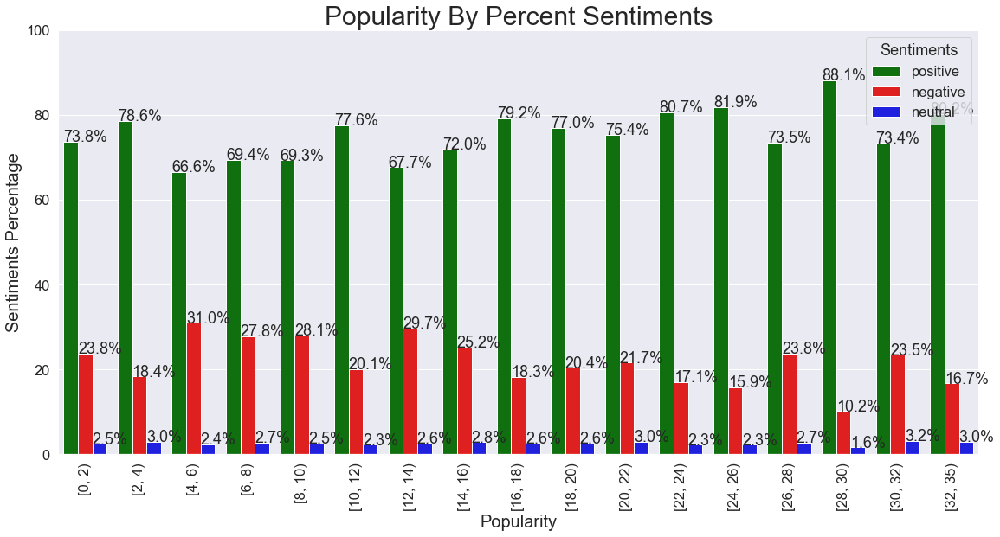

In [47]:
#To set up a threshold values
pop = ij
value_counts = pop['Popularity'].value_counts()
to_remove = value_counts[value_counts <= 1000].index
pop = pop[~pop.Popularity.isin(to_remove)]

plotting_percentages(pop,"Popularity","Sentiments")

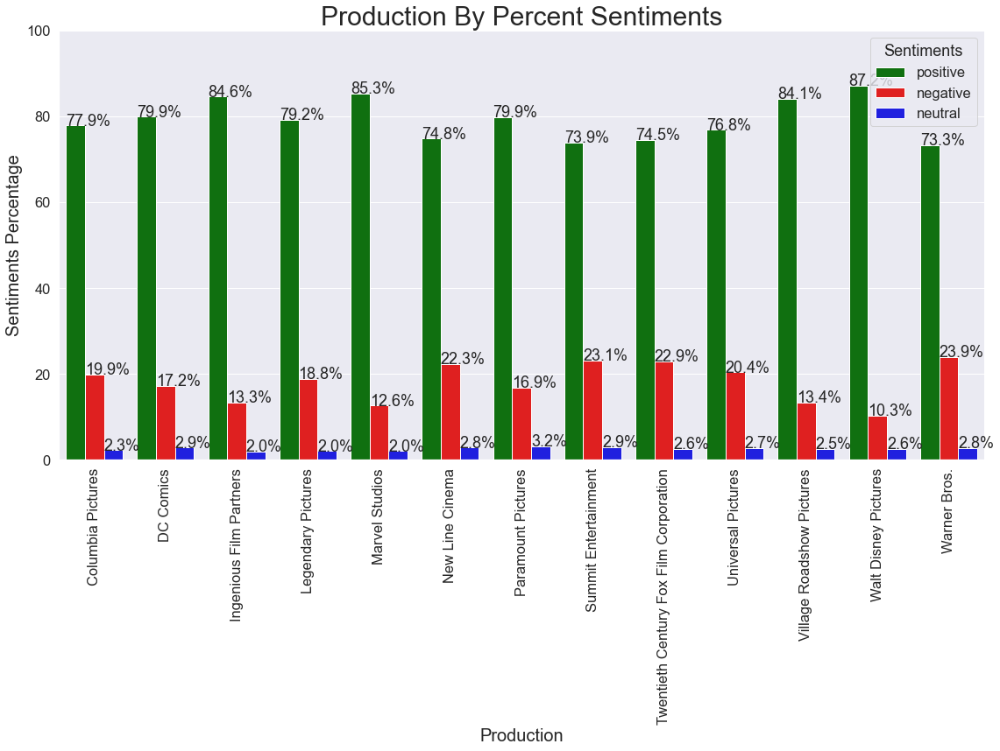

In [48]:
#To set up a threshold values
pro = ij
value_counts = pro['Production'].value_counts()
to_remove = value_counts[value_counts <= 4000].index
pro = pro[~pro.Production.isin(to_remove)]

plotting_percentages(pro,"Production","Sentiments")

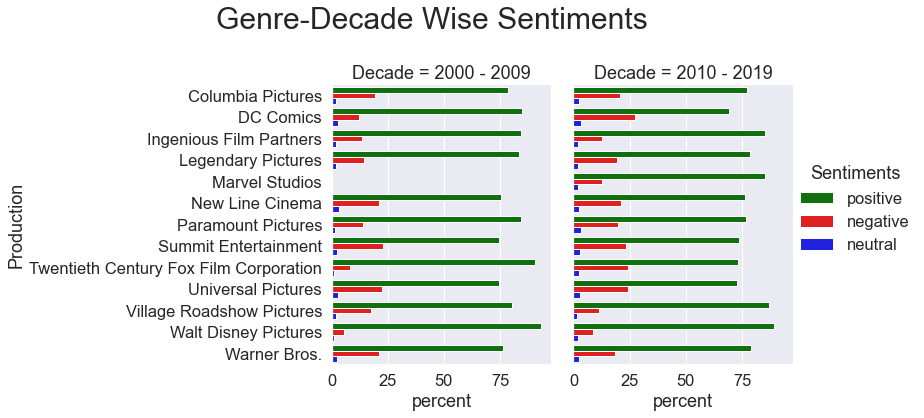

In [61]:
prodec = pro.loc[pro['Decade'].isin(['2000 - 2009', '2010 - 2019']),['Production','Decade','Sentiments']]
temp_df = prodec.groupby(["Production","Decade"])["Sentiments"].value_counts(normalize=True)
temp_df = temp_df.mul(100).rename('percent').reset_index()
dp = sns.catplot(y="Production", x="percent",col = "Decade", hue="Sentiments",kind="bar", height=6, aspect=1, data=temp_df, palette = sns.color_palette(palette, 3))
dp.fig.subplots_adjust(top=0.8)
dp.fig.suptitle('Genre-Decade Wise Sentiments', fontsize=30)
plt.savefig(path3 + 'Production-Decade Sentiments.jpg', bbox_inches="tight")

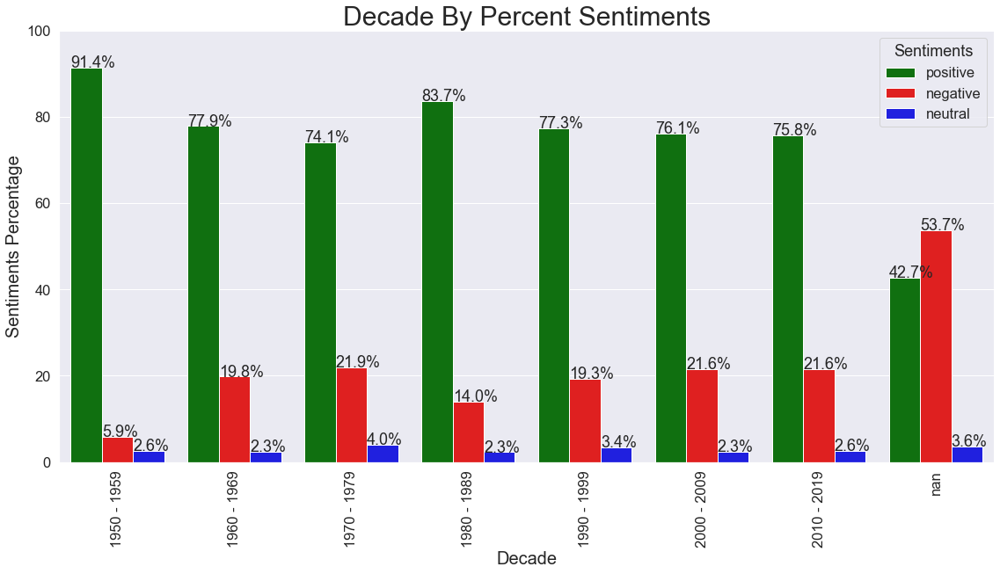

In [50]:
plotting_percentages(ij,"Decade","Sentiments")

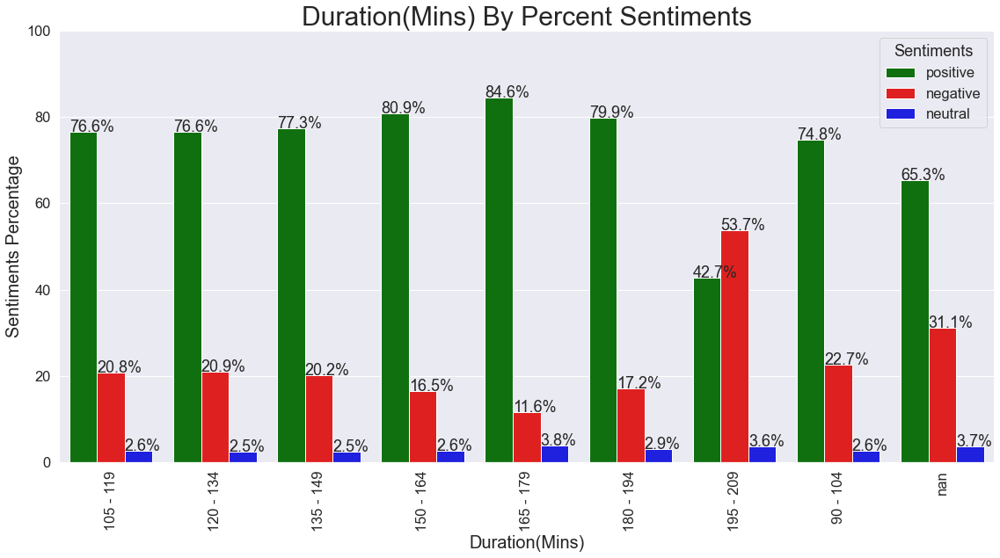

In [51]:
plotting_percentages(ij,"Duration(Mins)","Sentiments")

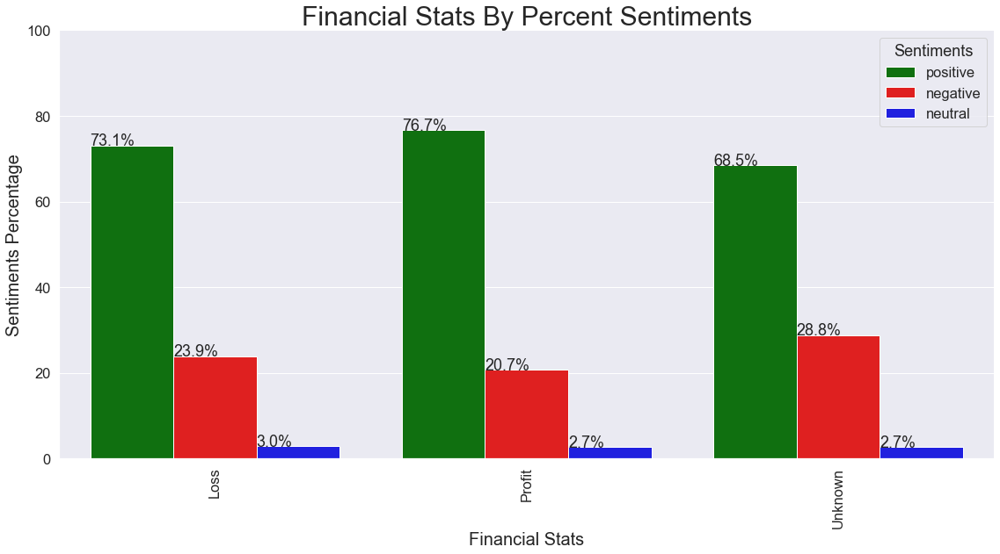

In [52]:
plotting_percentages(ij,"Financial Stats","Sentiments")

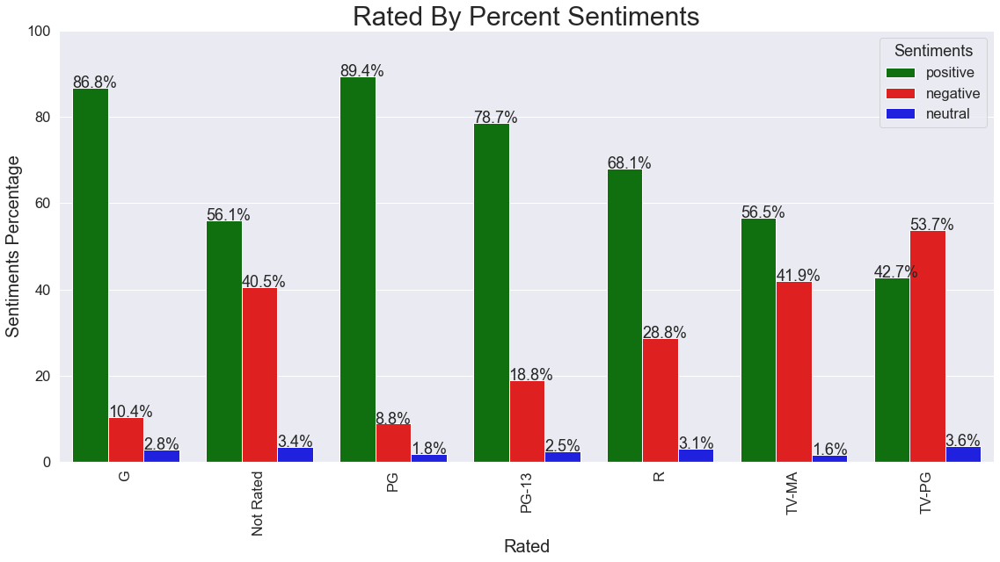

In [53]:
plotting_percentages(ij,"Rated","Sentiments")

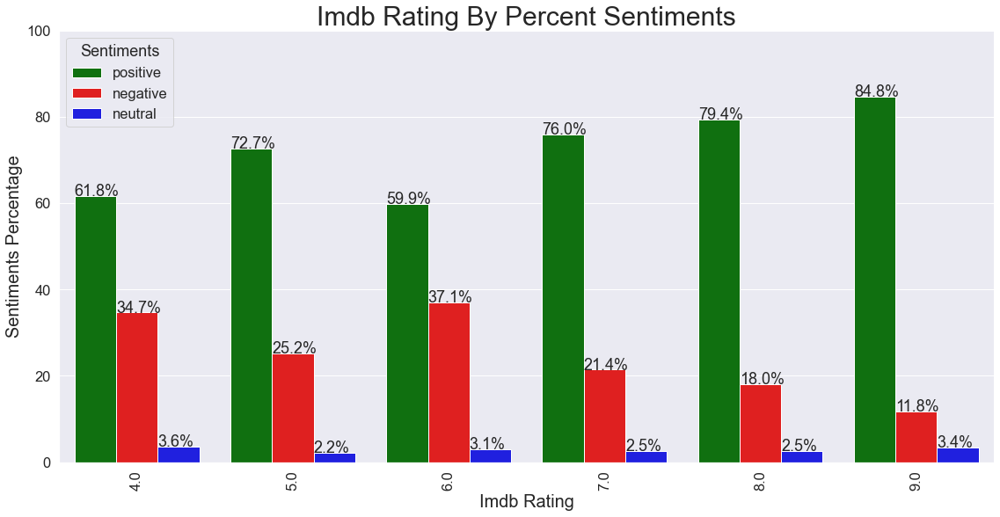

In [54]:
plotting_percentages(ij,"IMDB Rating","Sentiments")

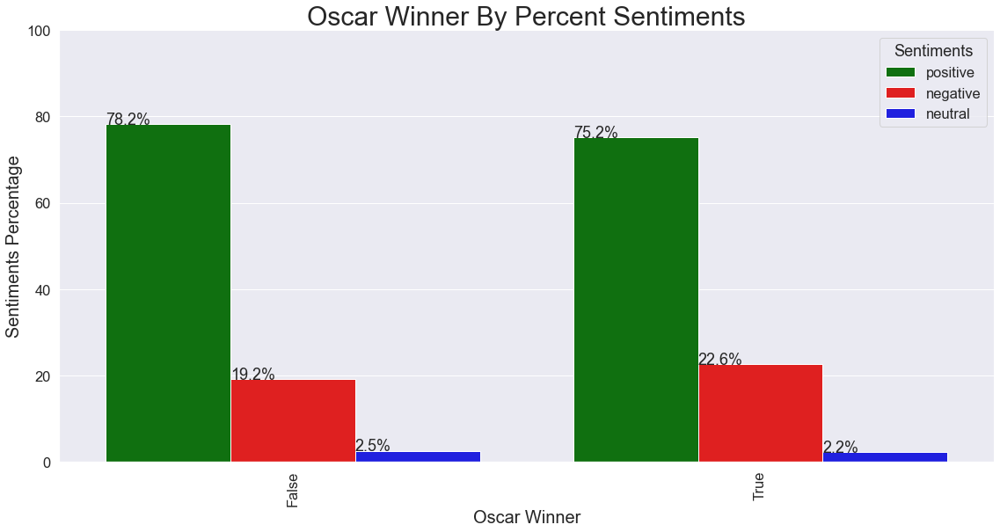

In [55]:
plotting_percentages(ijj,"Oscar Winner","Sentiments")